# Try different versions of computing pseudotime

Test the ideas on longtogeny dataset

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import colorcet as cc
from pathlib import Path
from toolz import concat, partial
from aging.plotting import format_plots, figure, legend, add_identity

# sklearn imports
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, PowerTransformer, FunctionTransformer
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score, cross_val_predict, LeaveOneGroupOut, GroupKFold, GridSearchCV, ShuffleSplit
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import ElasticNet
from sklearn.pipeline import make_pipeline
from scipy.spatial.distance import pdist, squareform

In [2]:
dotted_identity = partial(add_identity, linestyle='--', color='k')

In [3]:
format_plots()

In [4]:
version = 8
path = Path(f"/n/groups/datta/win/longtogeny/data/ontogeny/version_{version:02d}/ontogeny_males_clean_pseudotime_v02.parquet")

In [6]:
df = pd.read_parquet(path)

In [7]:
test_path = path.parent / "longtogeny_males_clean_v2.parquet"
test_df = pd.read_parquet(test_path).reindex(columns=df.columns).fillna(0)

## Determine best processing procedure for ontogeny data first

Do standard processing here

In [8]:
df = df.sort_index(level='pseudotime_rank')
new_ages = df.index.get_level_values('pseudo_age').values
y = new_ages
x = df

### PLS regression

In [12]:
pipeline = make_pipeline(
    StandardScaler(),
    PLSRegression(n_components=4)
)

In [13]:
preds = cross_val_predict(pipeline, x, y, cv=LeaveOneGroupOut(), groups=y, n_jobs=-1)
r2 = r2_score(y, preds)

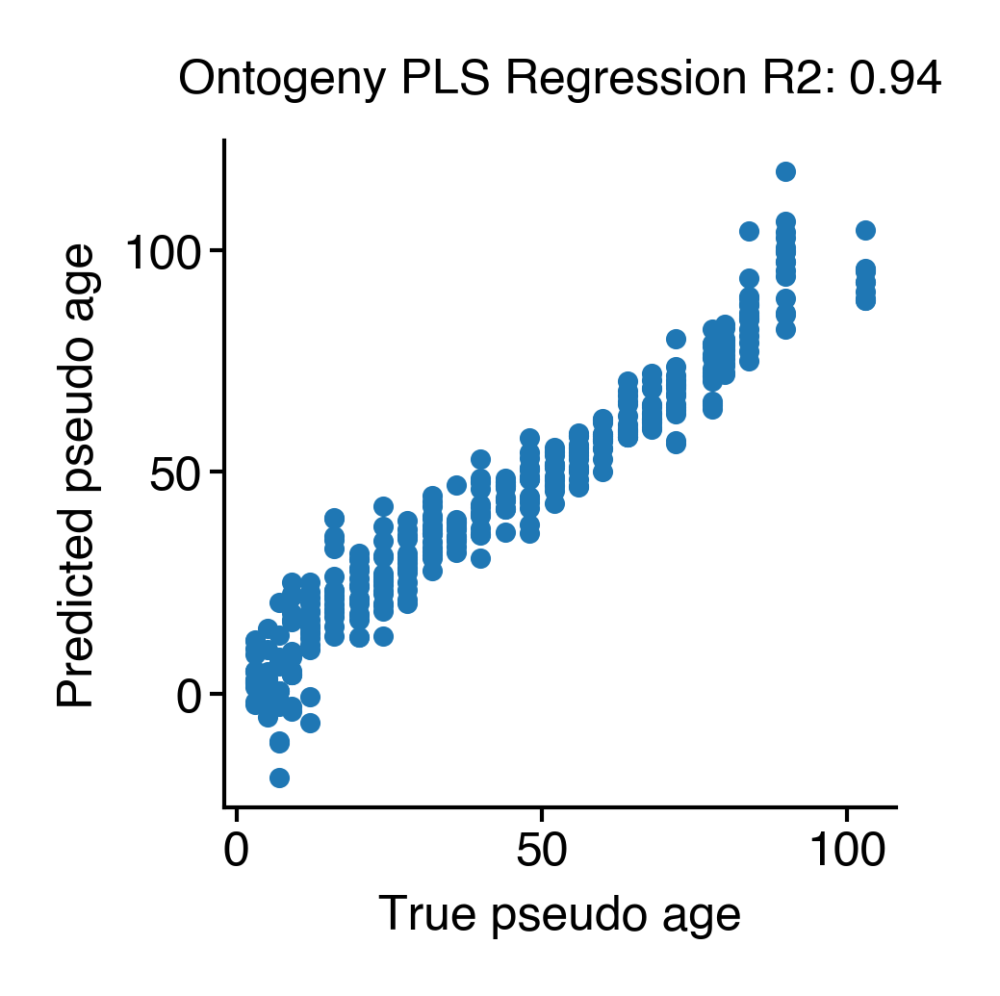

In [14]:
fig = figure(1.5, 1.5)
ax = fig.gca()
ax.scatter(y, preds, s=3)
ax.set(xlabel="True pseudo age", ylabel="Predicted pseudo age", title=f"Ontogeny PLS Regression R2: {r2:0.2f}")
sns.despine()

In [15]:
test_age = test_df.index.get_level_values("age") / 7
test_pred = pipeline.fit(x, y).predict(test_df)
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame({"age": test_age, "pred": test_pred, "mouse": test_df.index.get_level_values("mouse")})

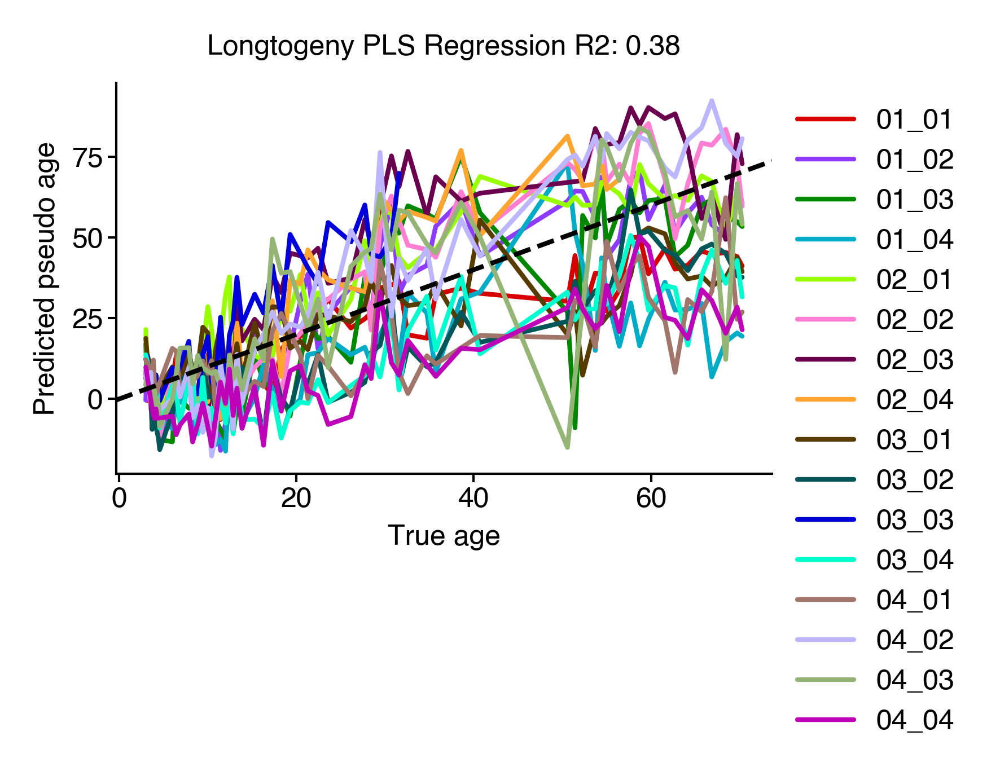

In [16]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(data=new_plt_df, x="age", y="pred", hue="mouse", lw=1, ax=ax, palette=cc.glasbey[:new_plt_df["mouse"].nunique()])
ax.set(xlabel="True age", ylabel="Predicted pseudo age", title=f"Longtogeny PLS Regression R2: {r2:0.2f}")
dotted_identity(ax)
legend(ax)
sns.despine()

In [17]:
roll_df = (
    test_df.sort_index(level="age")
    .groupby("mouse")
    .rolling(2)
    .mean()
    .droplevel(level=2)
    .dropna(how="all", axis=0)
)
test_age = roll_df.index.get_level_values("age") / 7
test_pred = pipeline.fit(x, y).predict(roll_df)
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": roll_df.index.get_level_values("mouse"),
    }
)

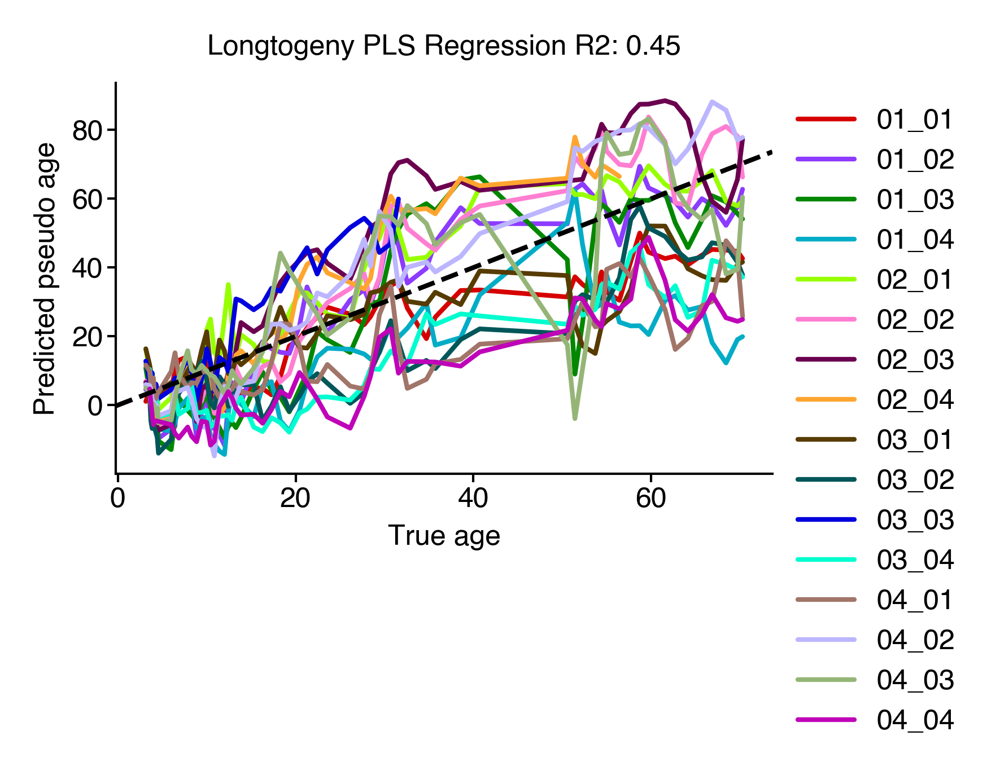

In [18]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(data=new_plt_df, x="age", y="pred", hue="mouse", lw=1, ax=ax, palette=cc.glasbey[:new_plt_df["mouse"].nunique()])
ax.set(xlabel="True age", ylabel="Predicted pseudo age", title=f"Longtogeny PLS Regression R2: {r2:0.2f}")
dotted_identity(ax)
legend(ax)
sns.despine()

### KNN regression

In [19]:
from scipy.spatial.distance import jensenshannon

In [61]:
pipeline = make_pipeline(
    # StandardScaler(),
    KNeighborsRegressor(n_neighbors=7, metric=jensenshannon, weights='distance')
)

In [62]:
gs = GridSearchCV(
    pipeline,
    dict(
        kneighborsregressor__n_neighbors=range(5, 10),
        kneighborsregressor__metric=['euclidean', 'minkowski', 'cosine', jensenshannon, 'correlation', ], 
    ),
    cv=ShuffleSplit(n_splits=4, test_size=0.4),
    n_jobs=-1,
)
gs.fit(x, y, groups=y)

GridSearchCV(cv=ShuffleSplit(n_splits=4, random_state=None, test_size=0.4, train_size=None),
             estimator=Pipeline(steps=[('kneighborsregressor',
                                        KNeighborsRegressor(metric=<function jensenshannon at 0x7f1d3ff99e10>,
                                                            n_neighbors=7,
                                                            weights='distance'))]),
             n_jobs=-1,
             param_grid={'kneighborsregressor__metric': ['euclidean',
                                                         'minkowski', 'cosine',
                                                         <function jensenshannon at 0x7f1d3ff99e10>,
                                                         'correlation'],
                         'kneighborsregressor__n_neighbors': range(5, 10)})

In [63]:
gs.best_params_

{'kneighborsregressor__metric': <function scipy.spatial.distance.jensenshannon(p, q, base=None, *, axis=0, keepdims=False)>,
 'kneighborsregressor__n_neighbors': 5}

In [64]:
# preds = cross_val_predict(pipeline, x, y, cv=LeaveOneGroupOut(), groups=y, n_jobs=-1)
preds = cross_val_predict(gs.best_estimator_, x, y, cv=LeaveOneGroupOut(), groups=y, n_jobs=-1)
r2 = r2_score(y, preds)
r2

0.960663648364297

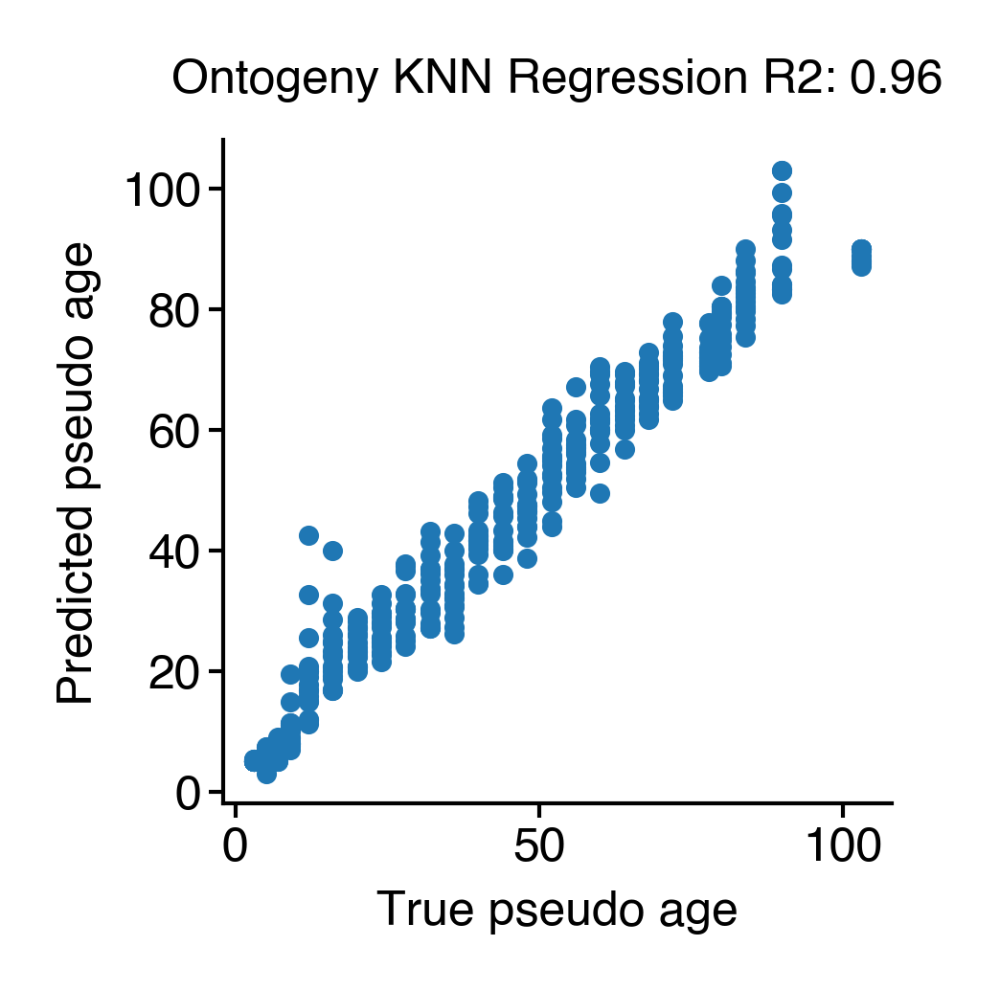

In [65]:
fig = figure(1.5, 1.5)
ax = fig.gca()
ax.scatter(y, preds, s=3)
ax.set(xlabel="True pseudo age", ylabel="Predicted pseudo age", title=f"Ontogeny KNN Regression R2: {r2:0.2f}")
sns.despine()

In [66]:
test_age = test_df.index.get_level_values("age") / 7
test_pred = pipeline.fit(x, y).predict(test_df)
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": test_df.index.get_level_values("mouse"),
    }
)

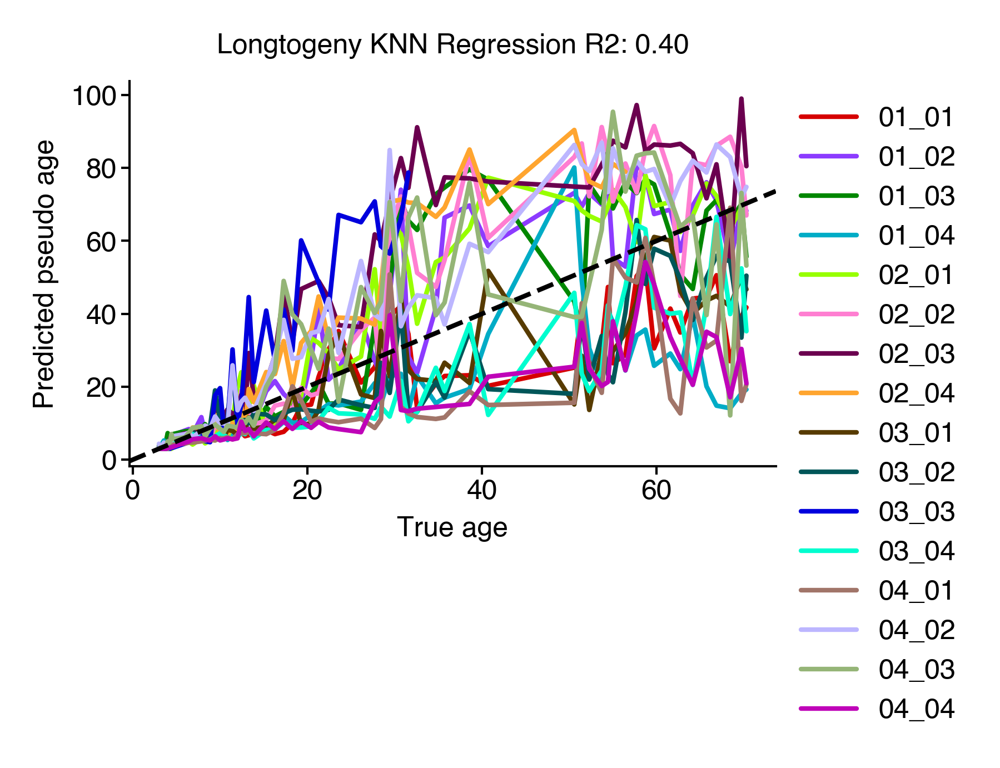

In [67]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny KNN Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

In [68]:
roll_df = (
    test_df.sort_index(level="age")
    .groupby("mouse")
    .rolling(2)
    .mean()
    .droplevel(level=2)
    .dropna(how="all", axis=0)
)
test_age = roll_df.index.get_level_values("age") / 7
test_pred = pipeline.fit(x, y).predict(roll_df)
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": roll_df.index.get_level_values("mouse"),
    }
)

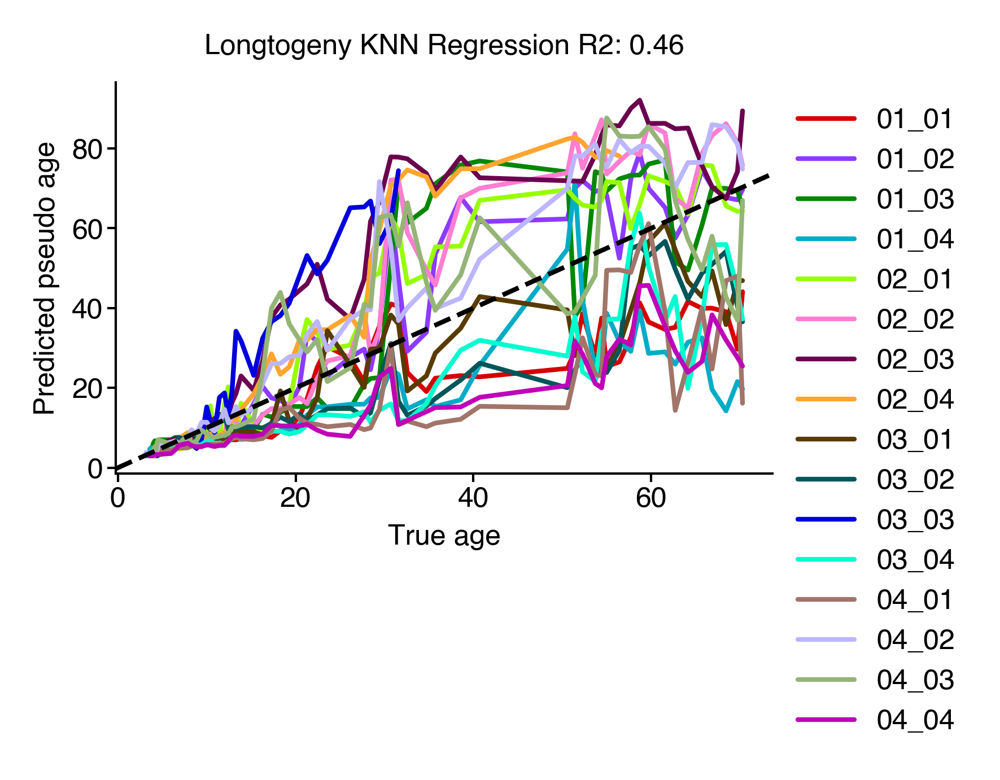

In [69]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny KNN Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

### Add non-linear syllable processing

#### V1 - PLS with x^2, log(x), (x - mean(x))^2

In [79]:
pipeline = make_pipeline(
    FunctionTransformer(lambda x: pd.concat([x, np.square(x), np.log(x + 1e-5), (np.square(x - x.mean()))], axis=1)),
    StandardScaler(),
    # FunctionTransformer(lambda x: np.concatenate([x, np.square(x)], axis=1)),
    PLSRegression(n_components=4)
)

In [80]:
preds = cross_val_predict(pipeline, x, y, cv=LeaveOneGroupOut(), groups=y, n_jobs=-1)
r2 = r2_score(y, preds)

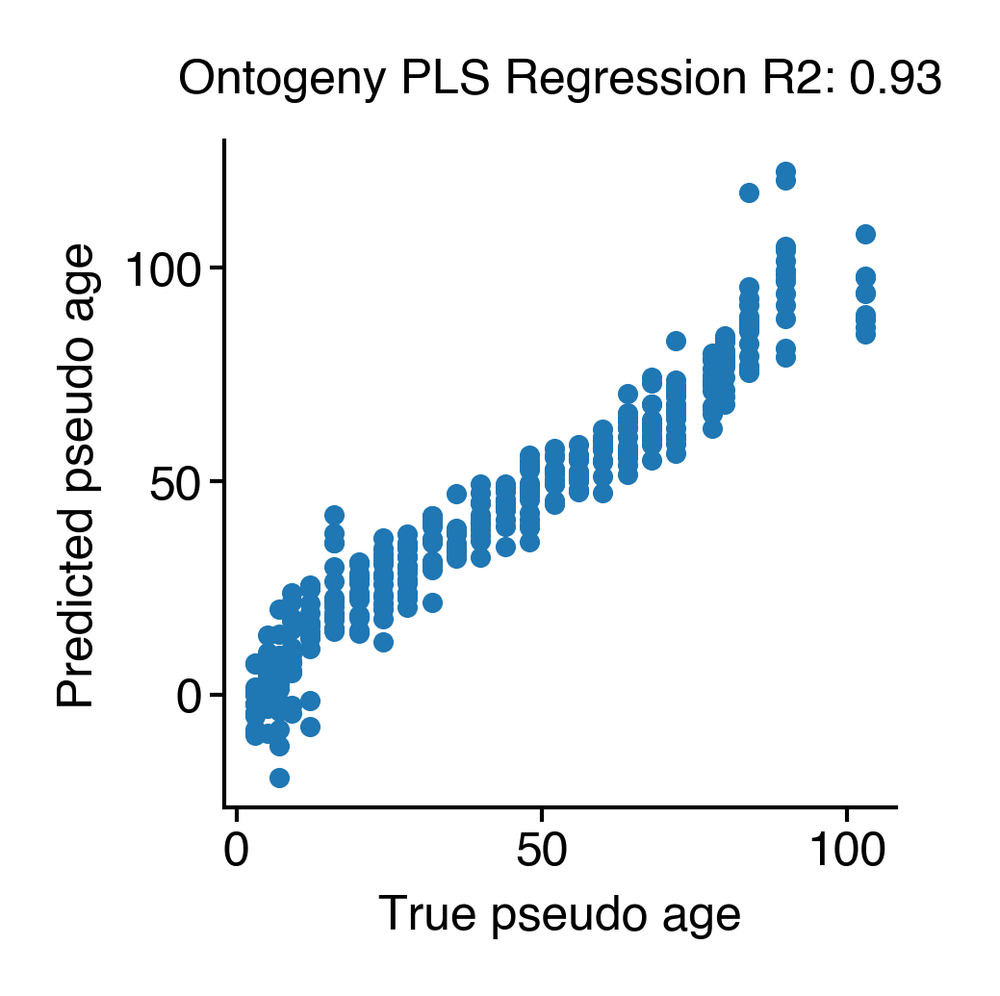

In [81]:
fig = figure(1.5, 1.5)
ax = fig.gca()
ax.scatter(y, preds, s=3)
ax.set(xlabel="True pseudo age", ylabel="Predicted pseudo age", title=f"Ontogeny PLS Regression R2: {r2:0.2f}")
sns.despine()

#### V2 - ElasticNet

In [82]:
pipeline = make_pipeline(
    FunctionTransformer(lambda x: pd.concat([x, np.square(x), np.log(x + 1e-5), (np.square(x - x.mean()))], axis=1)),
    StandardScaler(),
    ElasticNet(alpha=0.1, l1_ratio=0.5, max_iter=10_000)
)

In [85]:
keep_syll = x.mean() > 0.0025
keep_syll = keep_syll[keep_syll].index

In [86]:
cv = GridSearchCV(
    pipeline,
    param_grid={
        "elasticnet__alpha": np.logspace(-2, 2, 15),
        "elasticnet__l1_ratio": np.linspace(0, 1, 25),
    },
    cv=GroupKFold(n_splits=6),
    n_jobs=-1,
)

cv.fit(x[keep_syll], y, groups=y)

/home/wg41/miniconda3/envs/aging/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.714e+03, tolerance: 2.683e+01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/home/wg41/miniconda3/envs/aging/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.689e+03, tolerance: 2.920e+01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of th

GridSearchCV(cv=GroupKFold(n_splits=6),
             estimator=Pipeline(steps=[('functiontransformer',
                                        FunctionTransformer(func=<function <lambda> at 0x7f1d12f65360>)),
                                       ('standardscaler', StandardScaler()),
                                       ('elasticnet',
                                        ElasticNet(alpha=0.1,
                                                   max_iter=10000))]),
             n_jobs=-1,
             param_grid={'elasticnet__alpha': array([1.00000000e-02, 1.93069773e-02, 3.72759372e-02, 7.19685673e-02,
       1...
       1.93069773e+00, 3.72759372e+00, 7.19685673e+00, 1.38949549e+01,
       2.68269580e+01, 5.17947468e+01, 1.00000000e+02]),
                         'elasticnet__l1_ratio': array([0.        , 0.04166667, 0.08333333, 0.125     , 0.16666667,
       0.20833333, 0.25      , 0.29166667, 0.33333333, 0.375     ,
       0.41666667, 0.45833333, 0.5       , 0.54166667, 0.58333333,
       0.625     , 0.66666667, 0.70833333, 0.75      , 0.79166667,
       0.83333333, 0.875     , 0.91666667, 0.95833333, 1.        ])})

In [87]:
cv.best_params_

{'elasticnet__alpha': 0.2682695795279725, 'elasticnet__l1_ratio': 1.0}

In [88]:
cv.best_score_

0.8897120858847879

In [89]:
est = cv.best_estimator_.fit(x[keep_syll], y)

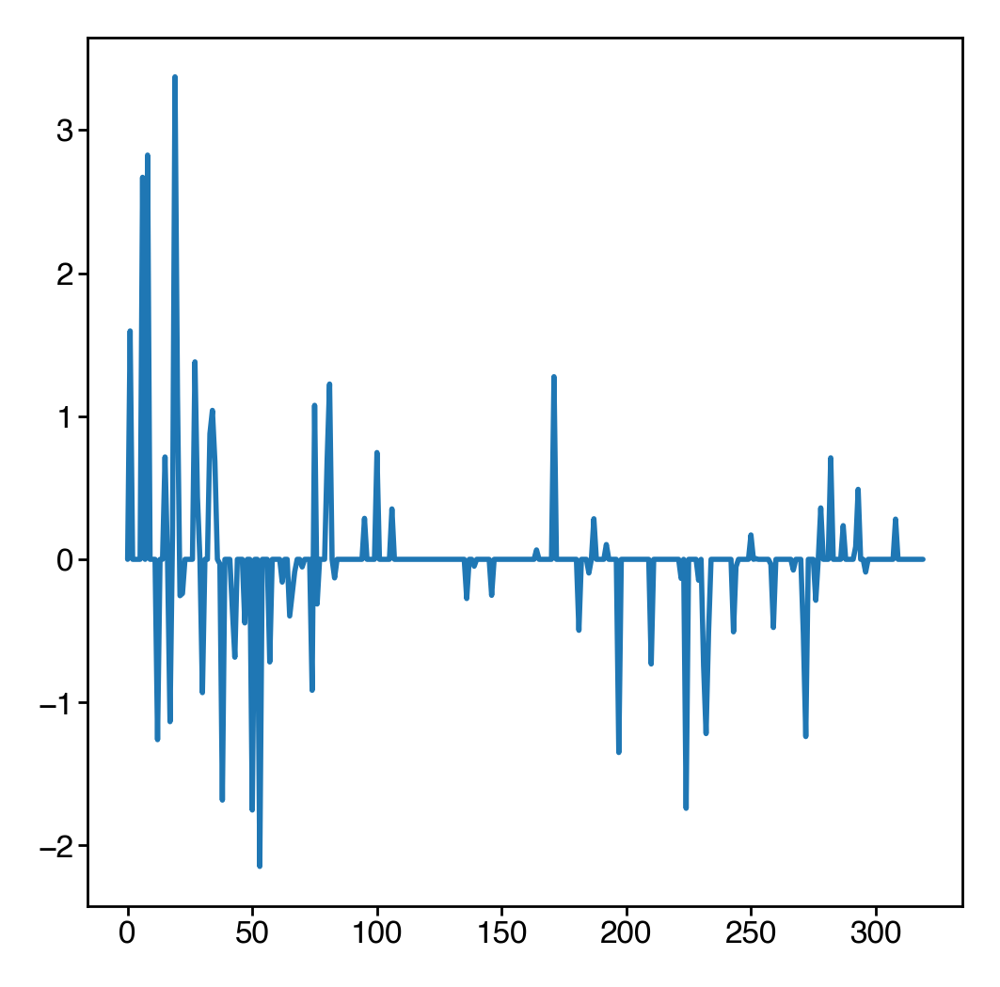

In [90]:
plt.plot(est.steps[-1][-1].coef_)

In [91]:
preds = cross_val_predict(est, x[keep_syll], y, cv=LeaveOneGroupOut(), groups=y, n_jobs=-1)
r2 = r2_score(y, preds)

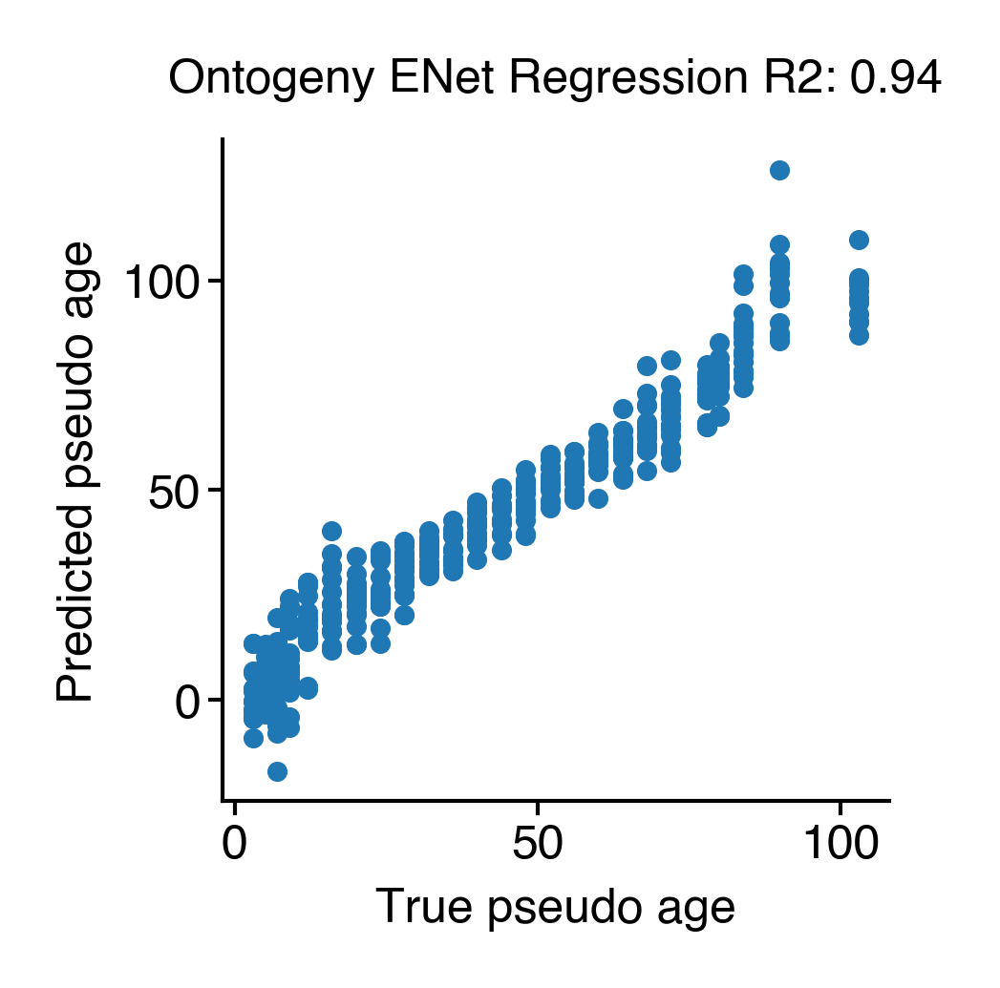

In [92]:
fig = figure(1.5, 1.5)
ax = fig.gca()
ax.scatter(y, preds, s=3)
ax.set(xlabel="True pseudo age", ylabel="Predicted pseudo age", title=f"Ontogeny ENet Regression R2: {r2:0.2f}")
sns.despine()

In [93]:
test_age = test_df.index.get_level_values("age") / 7
test_pred = est.fit(x[keep_syll], y).predict(test_df[keep_syll])
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": test_df.index.get_level_values("mouse"),
    }
)

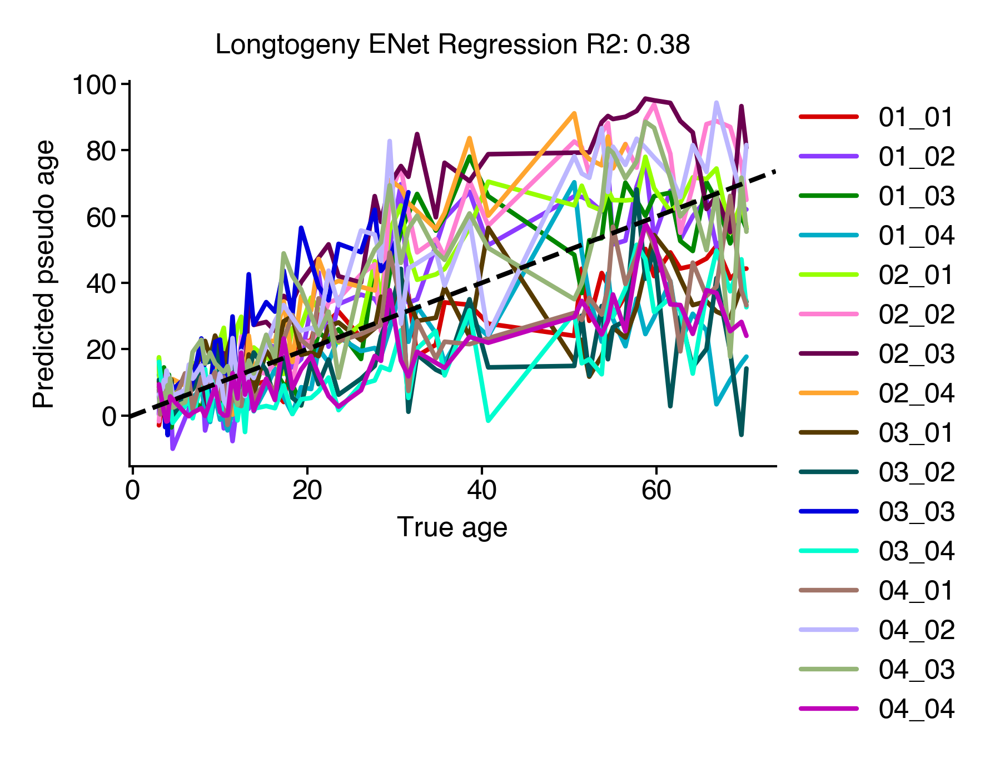

In [94]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
    hue_order=np.sort(new_plt_df["mouse"].unique()),
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny ENet Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

In [95]:
roll_df = (
    test_df.sort_index(level="age")
    .groupby("mouse")
    .rolling(2)
    .mean()
    .droplevel(level=2)
    .dropna(how="all", axis=0)
)
test_age = roll_df.index.get_level_values("age") / 7
test_pred = pipeline.fit(x[keep_syll], y).predict(roll_df[keep_syll])
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": roll_df.index.get_level_values("mouse"),
    }
)

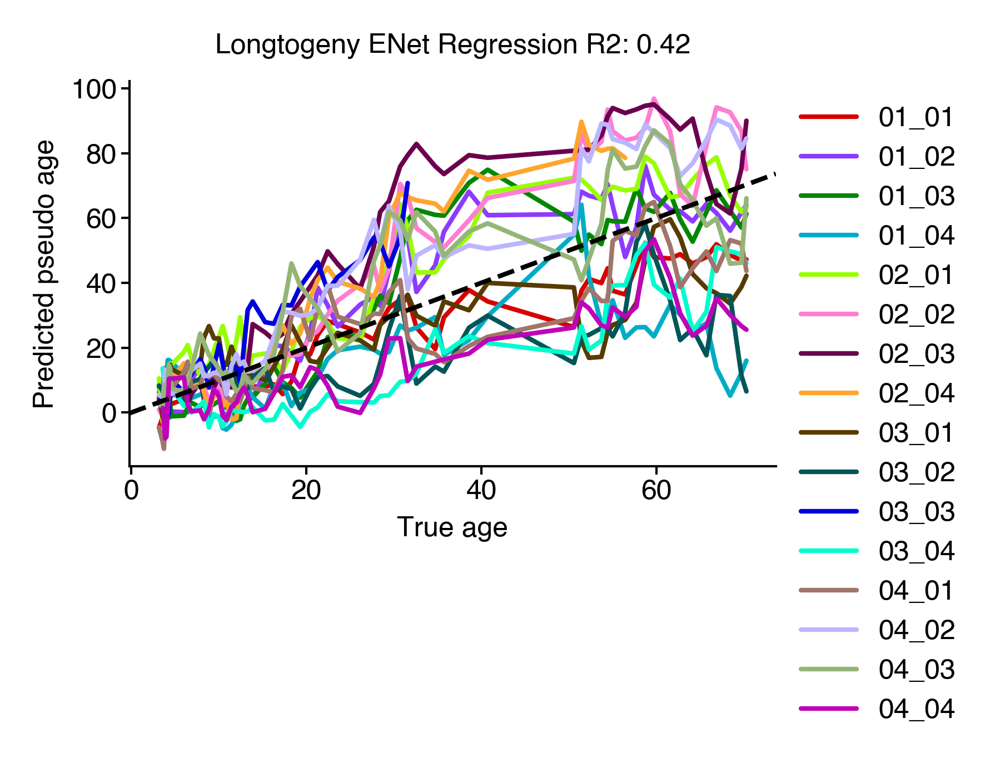

In [96]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny ENet Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

#### V3 - Power transform

In [97]:
pipeline = make_pipeline(
    PowerTransformer(),
    StandardScaler(),
    PLSRegression(n_components=4)
)

In [98]:
preds = cross_val_predict(pipeline, x, y, cv=LeaveOneGroupOut(), groups=y, n_jobs=-1)
r2 = r2_score(y, preds)
r2

0.944221903303717

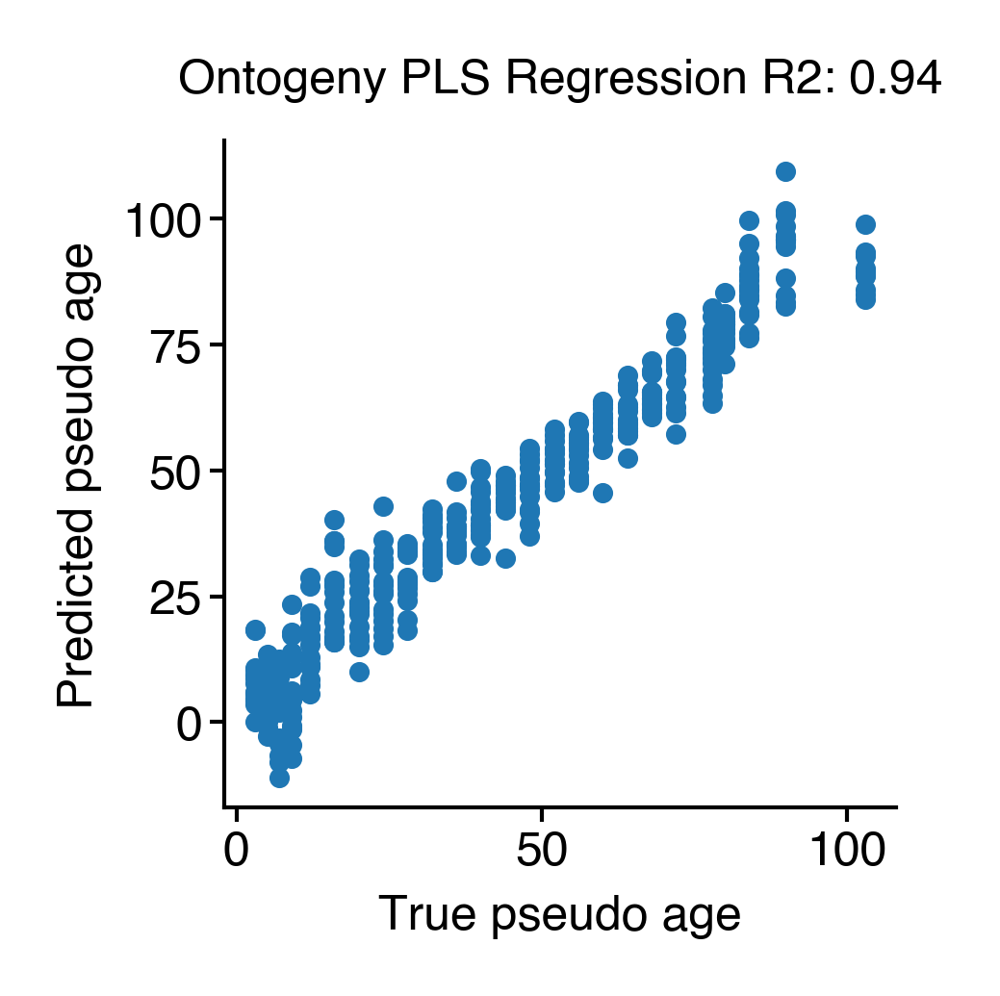

In [99]:
fig = figure(1.5, 1.5)
ax = fig.gca()
ax.scatter(y, preds, s=3)
ax.set(xlabel="True pseudo age", ylabel="Predicted pseudo age", title=f"Ontogeny PLS Regression R2: {r2:0.2f}")
sns.despine()

In [100]:
test_age = test_df.index.get_level_values("age") / 7
test_pred = pipeline.fit(x, y).predict(test_df)
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": test_df.index.get_level_values("mouse"),
    }
)

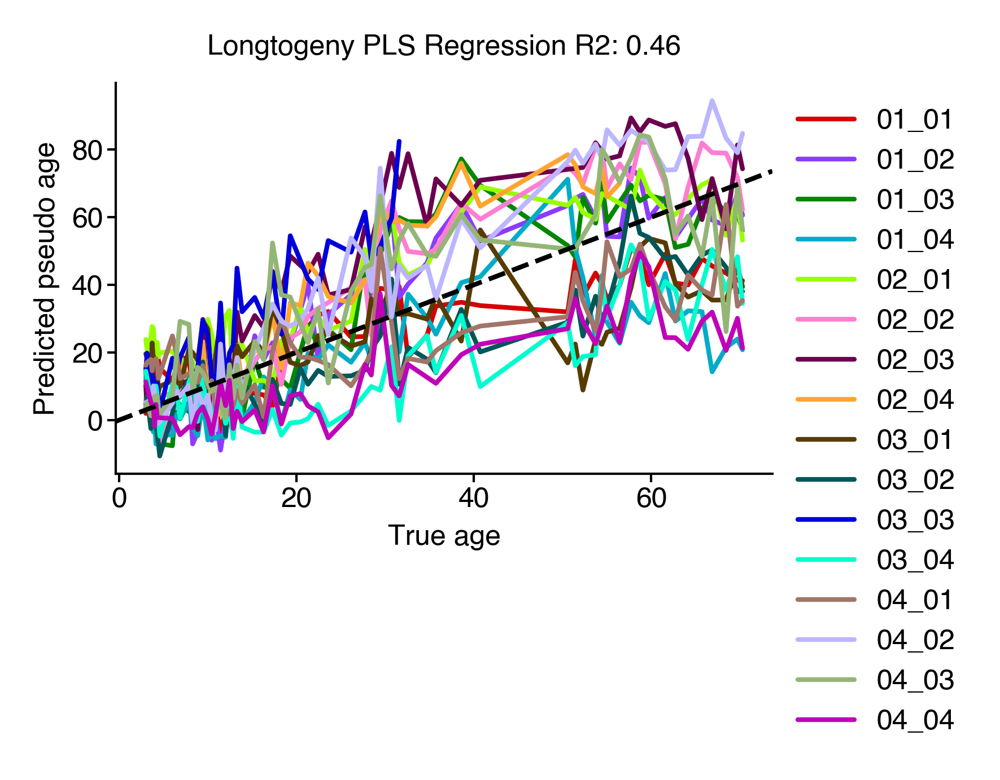

In [101]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny PLS Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

In [102]:
roll_df = (
    test_df.sort_index(level="age")
    .groupby("mouse")
    .rolling(2)
    .mean()
    .droplevel(level=2)
    .dropna(how="all", axis=0)
)
test_age = roll_df.index.get_level_values("age") / 7
test_pred = pipeline.fit(x, y).predict(roll_df)
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": roll_df.index.get_level_values("mouse"),
    }
)

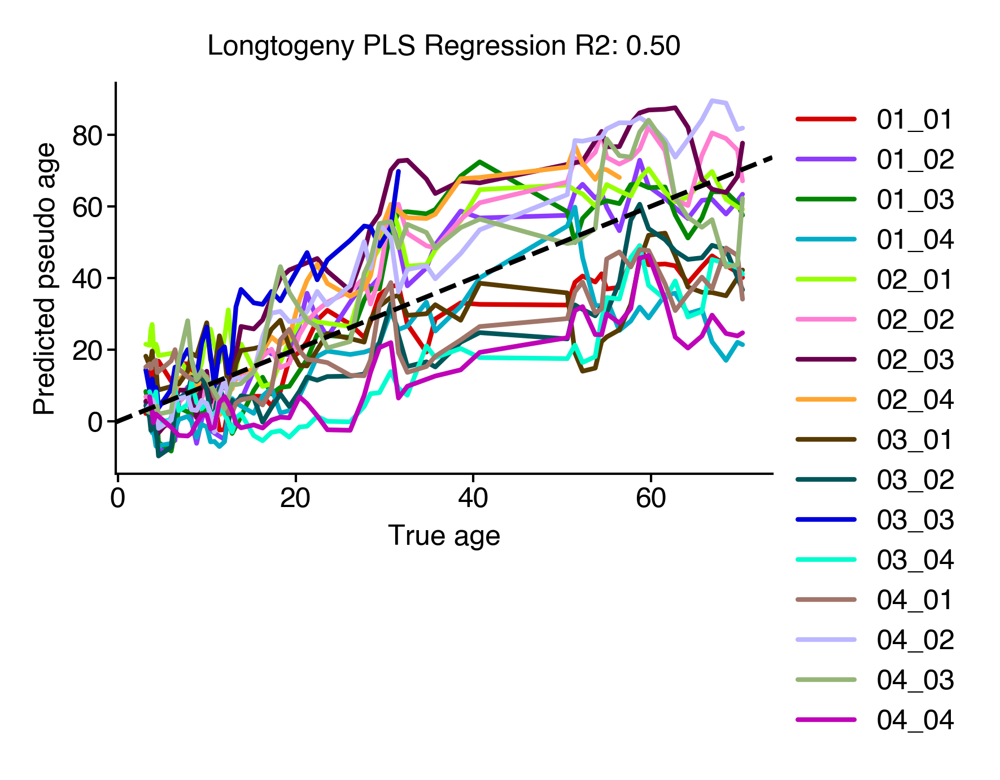

In [103]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny PLS Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

#### V5 - polynomial features with interactions

In [118]:
pipeline = make_pipeline(
    PolynomialFeatures(degree=2), StandardScaler(), PLSRegression(n_components=7)
)

preds = cross_val_predict(
    pipeline, x[keep_syll], y, cv=LeaveOneGroupOut(), groups=y, n_jobs=-1
)
r2 = r2_score(y, preds)
r2

0.9595569667560847

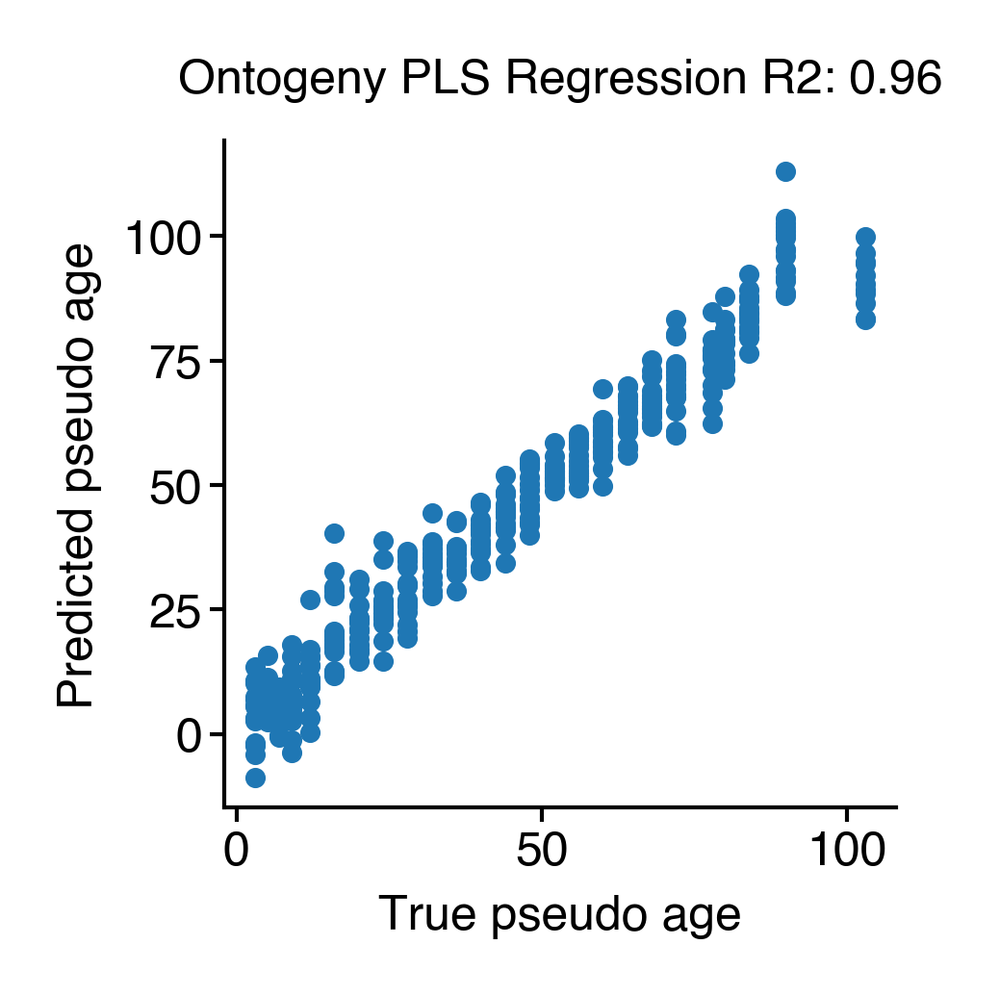

In [119]:
fig = figure(1.5, 1.5)
ax = fig.gca()
ax.scatter(y, preds, s=3)
ax.set(xlabel="True pseudo age", ylabel="Predicted pseudo age", title=f"Ontogeny PLS Regression R2: {r2:0.2f}")
sns.despine()

In [120]:
test_age = test_df.index.get_level_values("age") / 7
test_pred = pipeline.fit(x[keep_syll], y).predict(test_df[keep_syll])
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": test_df.index.get_level_values("mouse"),
    }
)

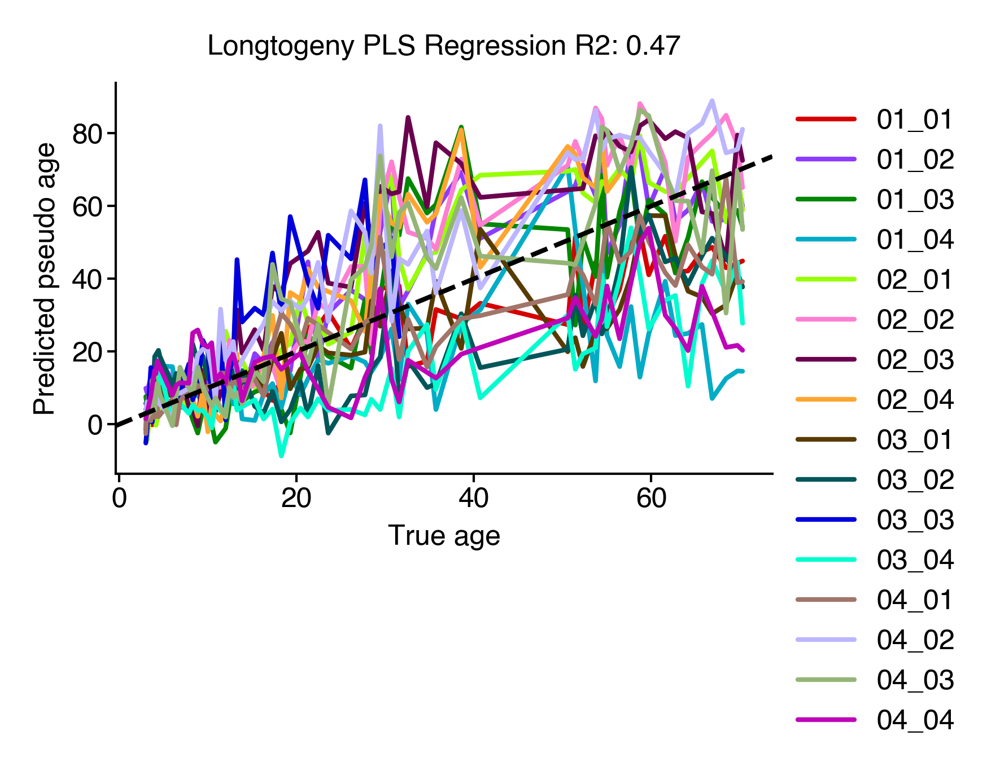

In [121]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
    hue_order=np.sort(new_plt_df["mouse"].unique()),
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny PLS Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

In [122]:
roll_df = (
    test_df.sort_index(level="age")
    .groupby("mouse")
    .rolling(2)
    .mean()
    .droplevel(level=2)
    .dropna(how="all", axis=0)
)
test_age = roll_df.index.get_level_values("age") / 7
test_pred = pipeline.fit(x[keep_syll], y).predict(roll_df[keep_syll])
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": roll_df.index.get_level_values("mouse"),
    }
)

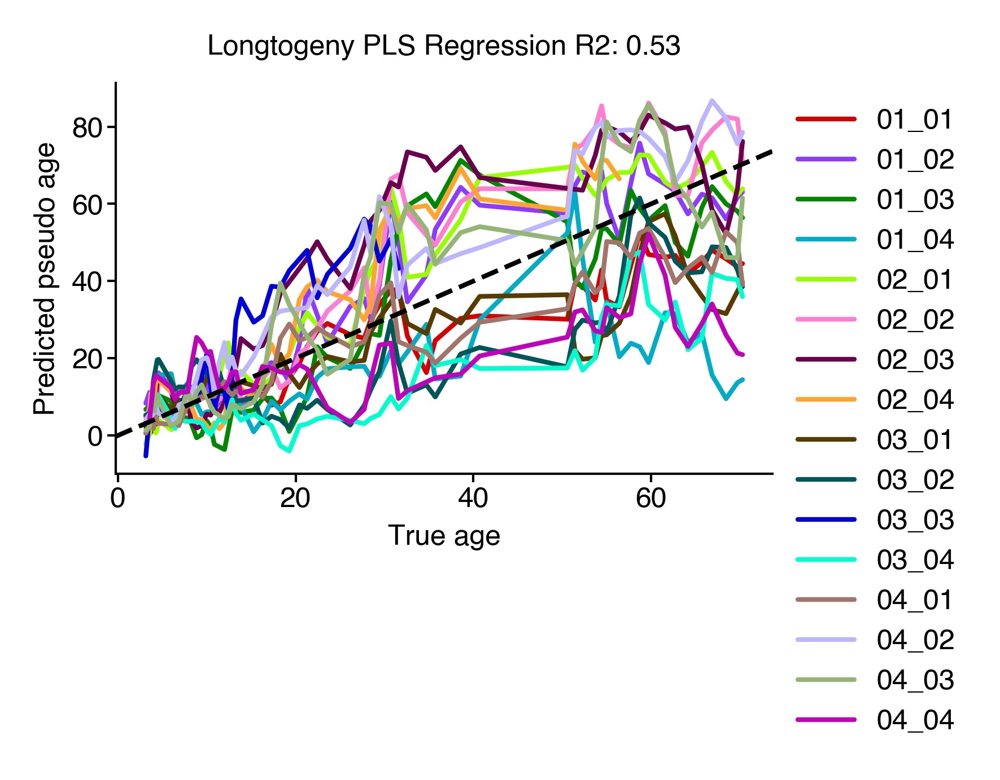

In [123]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny PLS Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

#### Kernel regression

In [124]:
from sklearn.kernel_ridge import KernelRidge

In [138]:
pipeline = make_pipeline(
    # PolynomialFeatures(degree=2),
    StandardScaler(),
    KernelRidge(kernel='rbf', alpha=1.0)
)

In [139]:
keep_syll = x.mean() > 0.0025
keep_syll = keep_syll[keep_syll].index

In [140]:
cv = GridSearchCV(
    pipeline,
    param_grid={
        "kernelridge__alpha": np.logspace(-2, 2, 21),
        "kernelridge__gamma": np.logspace(-2, 2, 21),
        "kernelridge__degree": range(3, 6),
        "kernelridge__kernel": ["chi2", "linear", "poly", "rbf", "cosine"],
    },
    cv=GroupKFold(n_splits=5),
    n_jobs=-1,
)

cv.fit(x[keep_syll], y, groups=y)

/home/wg41/miniconda3/envs/aging/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
6615 fits failed out of a total of 33075.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
6615 fits failed with the following error:
Traceback (most recent call last):
  File "/home/wg41/miniconda3/envs/aging/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/wg41/miniconda3/envs/aging/lib/python3.10/site-packages/sklearn/base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/home/wg41/miniconda3/envs/aging/lib/python3.10/site-packages/sklearn/pipeline.py", line 427, in 

GridSearchCV(cv=GroupKFold(n_splits=5),
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('kernelridge',
                                        KernelRidge(alpha=1.0, kernel='rbf'))]),
             n_jobs=-1,
             param_grid={'kernelridge__alpha': array([1.00000000e-02, 1.58489319e-02, 2.51188643e-02, 3.98107171e-02,
       6.30957344e-02, 1.00000000e-01, 1.58489319e-01, 2.51188643e-01,
       3.98107171e-01, 6.30957344...
                         'kernelridge__gamma': array([1.00000000e-02, 1.58489319e-02, 2.51188643e-02, 3.98107171e-02,
       6.30957344e-02, 1.00000000e-01, 1.58489319e-01, 2.51188643e-01,
       3.98107171e-01, 6.30957344e-01, 1.00000000e+00, 1.58489319e+00,
       2.51188643e+00, 3.98107171e+00, 6.30957344e+00, 1.00000000e+01,
       1.58489319e+01, 2.51188643e+01, 3.98107171e+01, 6.30957344e+01,
       1.00000000e+02]),
                         'kernelridge__kernel': ['chi2', 'linear', 'poly',
                                                 'rbf', 'cosine']})

In [141]:
cv.best_score_

0.9469926210063353

In [142]:
cv.best_params_

{'kernelridge__alpha': 0.6309573444801934,
 'kernelridge__degree': 3,
 'kernelridge__gamma': 0.01,
 'kernelridge__kernel': 'poly'}

In [143]:
preds = cross_val_predict(cv.best_estimator_, x[keep_syll], y, cv=LeaveOneGroupOut(), groups=y, n_jobs=-1)
r2 = r2_score(y, preds)
r2

0.955470105008274

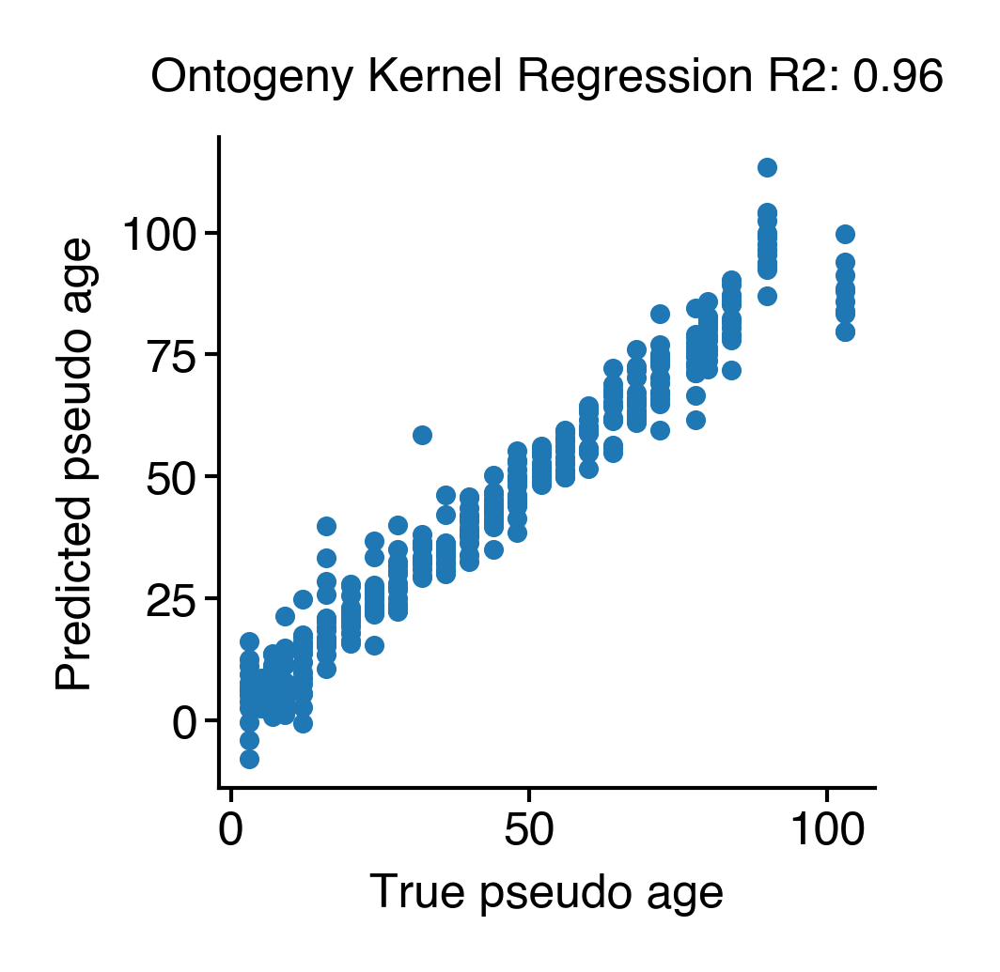

In [144]:
fig = figure(1.5, 1.5)
ax = fig.gca()
ax.scatter(y, preds, s=3)
ax.set(xlabel="True pseudo age", ylabel="Predicted pseudo age", title=f"Ontogeny Kernel Regression R2: {r2:0.2f}")
sns.despine()

In [145]:
test_age = test_df.index.get_level_values("age") / 7
test_pred = cv.best_estimator_.fit(x[keep_syll], y).predict(test_df[keep_syll])
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": test_df.index.get_level_values("mouse"),
    }
)

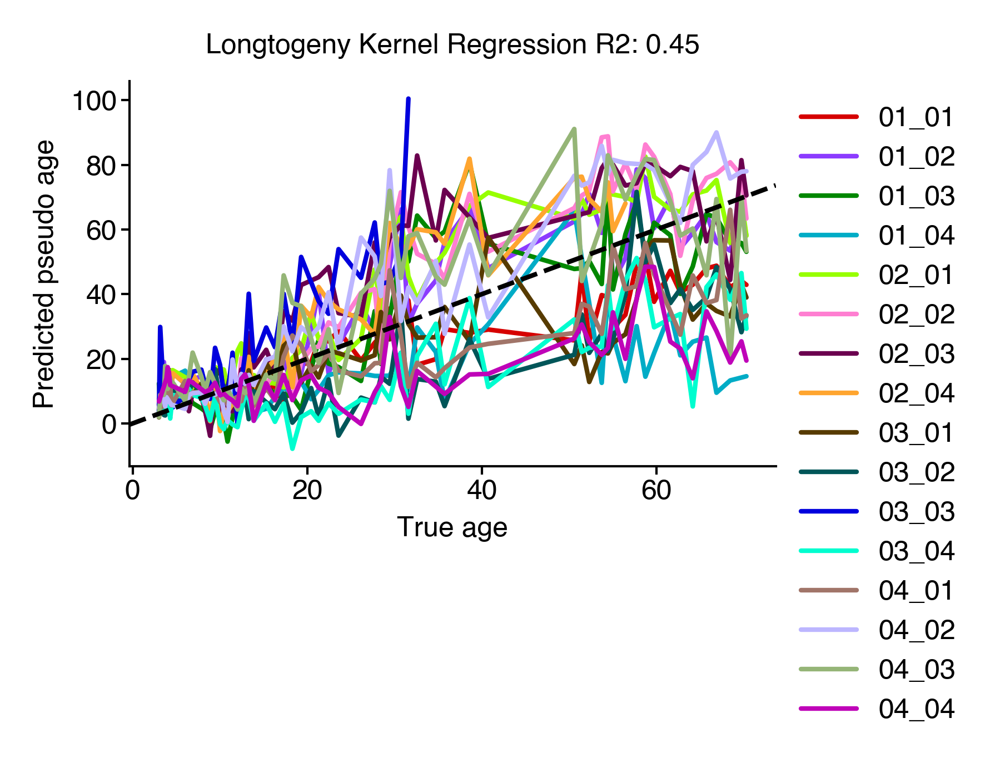

In [146]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
    hue_order=np.sort(new_plt_df["mouse"].unique()),
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny Kernel Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

In [147]:
roll_df = (
    test_df.sort_index(level="age")
    .groupby("mouse")
    .rolling(2)
    .mean()
    .droplevel(level=2)
    .dropna(how="all", axis=0)
)
test_age = roll_df.index.get_level_values("age") / 7
test_pred = cv.best_estimator_.fit(x[keep_syll], y).predict(roll_df[keep_syll])
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": roll_df.index.get_level_values("mouse"),
    }
)

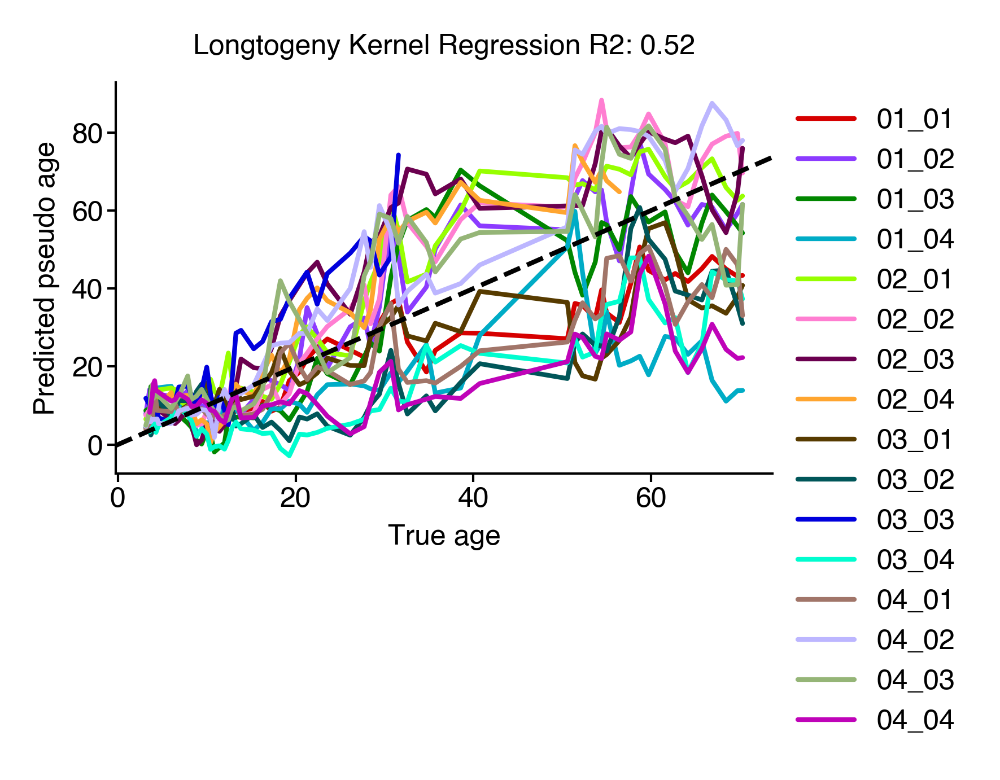

In [148]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny Kernel Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

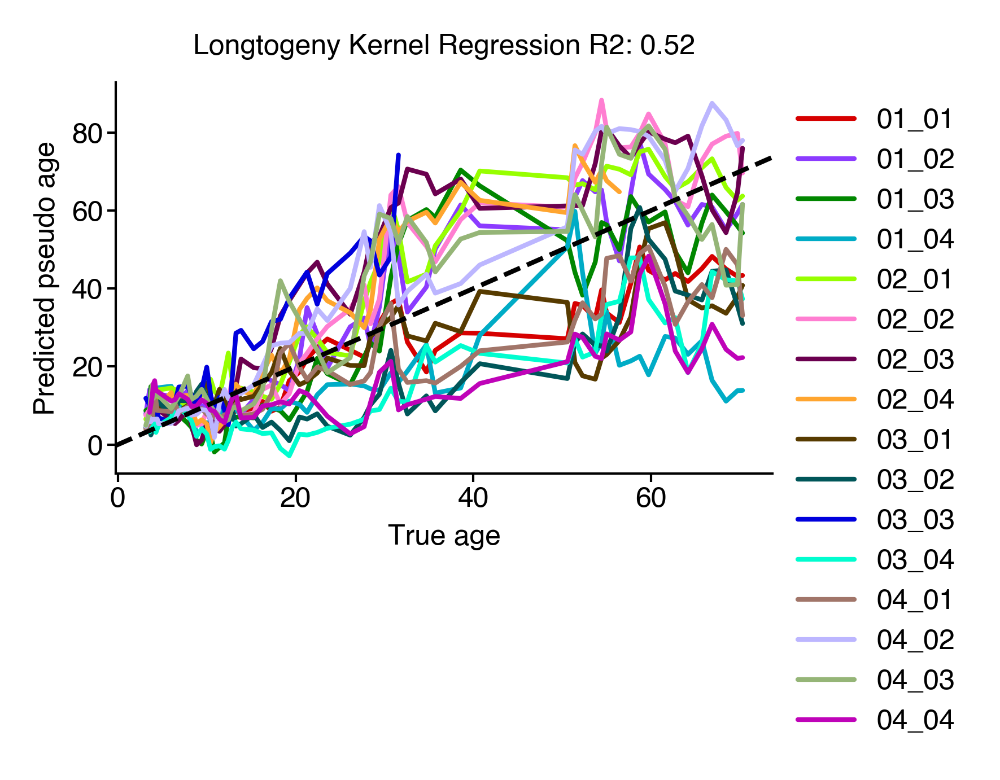

In [148]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny Kernel Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

In [149]:
roll_df = (
    test_df.sort_index(level="age")
    .groupby("mouse")
    .rolling(3)
    .mean()
    .droplevel(level=2)
    .dropna(how="all", axis=0)
)
test_age = roll_df.index.get_level_values("age") / 7
test_pred = cv.best_estimator_.fit(x[keep_syll], y).predict(roll_df[keep_syll])
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame(
    {
        "age": test_age,
        "pred": test_pred,
        "mouse": roll_df.index.get_level_values("mouse"),
    }
)

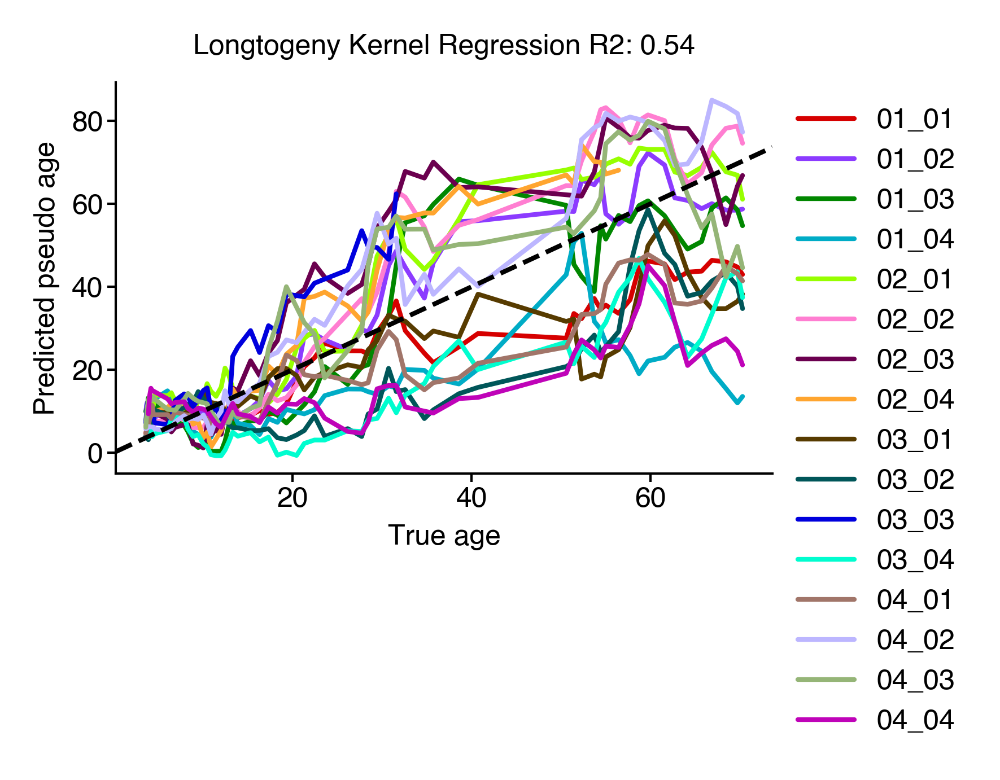

In [150]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny Kernel Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

### Use pseudotime rank instead

In [67]:
rank_y = df.index.get_level_values("pseudotime_rank")
x = df

In [69]:
pipeline = make_pipeline(
    StandardScaler(),
    PLSRegression(n_components=5)
)

In [71]:
preds = cross_val_predict(
    pipeline,
    x,
    rank_y,
    cv=LeaveOneGroupOut(),
    groups=df.index.get_level_values("pseudo_age"),
    n_jobs=-1,
)
r2 = r2_score(rank_y, preds)
r2

0.9551398412655784

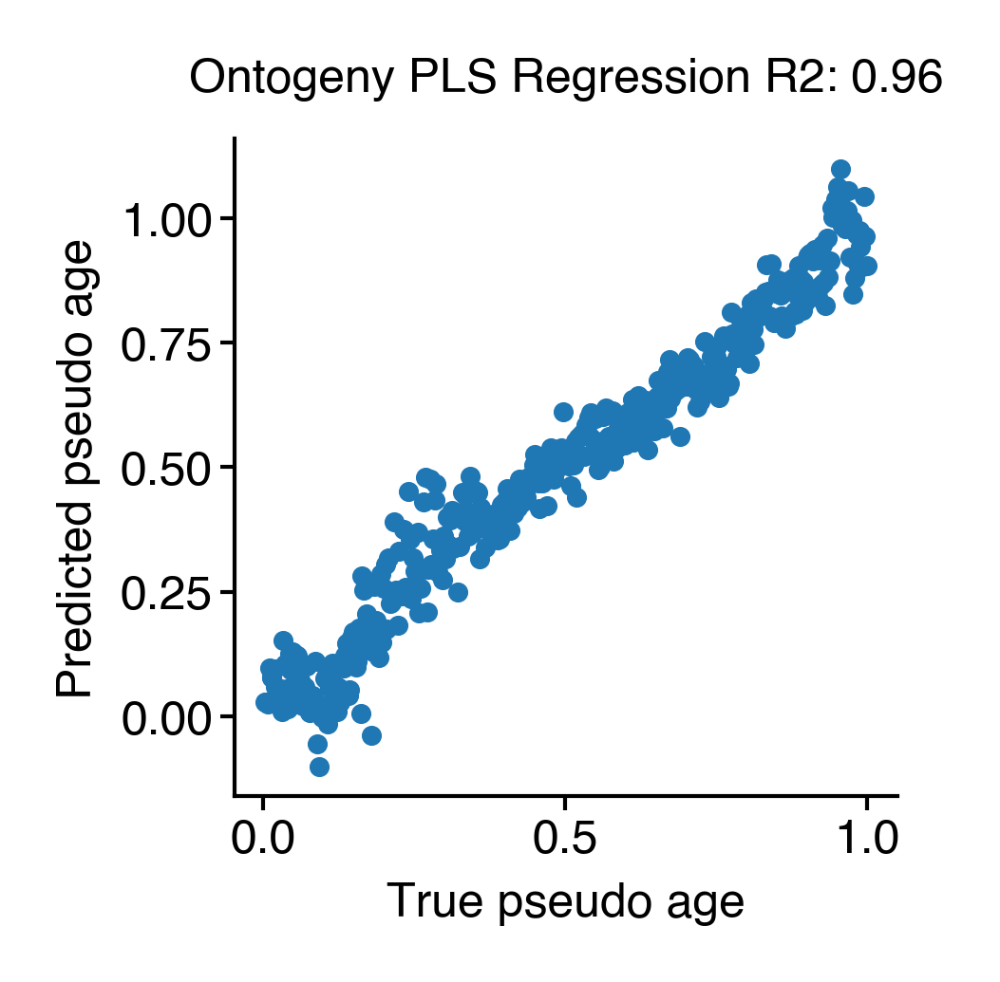

In [72]:
fig = figure(1.5, 1.5)
ax = fig.gca()
ax.scatter(rank_y, preds, s=3)
ax.set(xlabel="True pseudo age", ylabel="Predicted pseudo age", title=f"Ontogeny PLS Regression R2: {r2:0.2f}")
sns.despine()

In [73]:
test_age = test_df.index.get_level_values("age") / 7
test_pred = pipeline.fit(x, rank_y).predict(test_df)
r2 = r2_score(test_age, test_pred)
new_plt_df = pd.DataFrame({"age": test_age, "pred": test_pred, "mouse": test_df.index.get_level_values("mouse")})

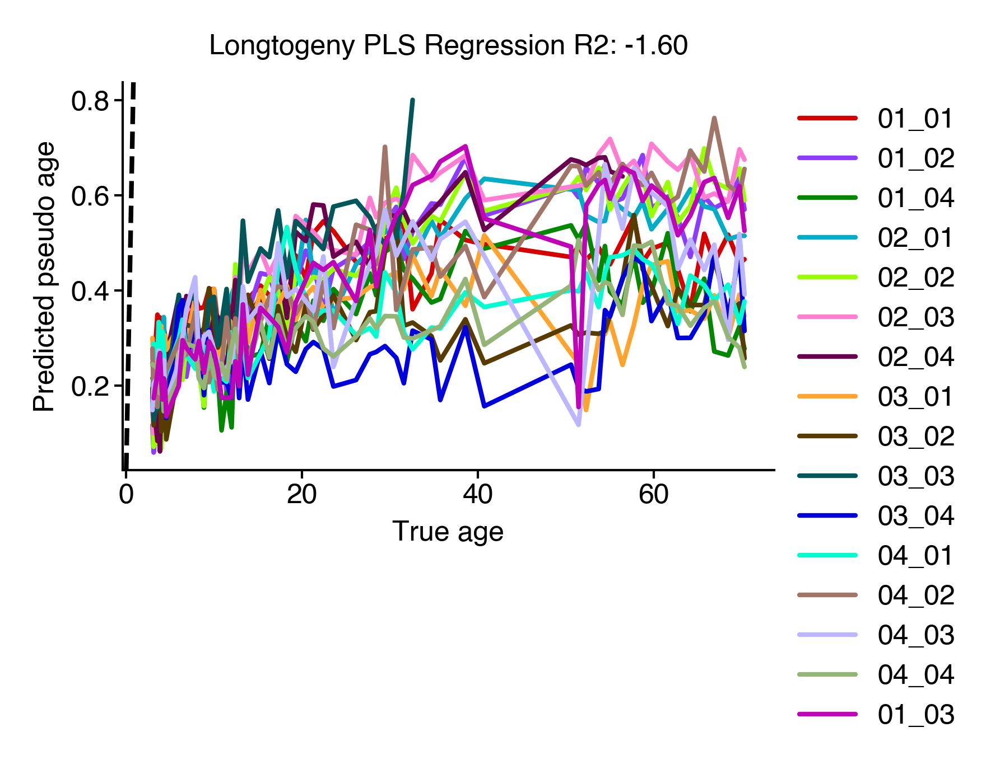

In [74]:
fig = figure(2.5, 1.5)
ax = fig.gca()
ax = sns.lineplot(
    data=new_plt_df,
    x="age",
    y="pred",
    hue="mouse",
    lw=1,
    ax=ax,
    palette=cc.glasbey[: new_plt_df["mouse"].nunique()],
)
ax.set(
    xlabel="True age",
    ylabel="Predicted pseudo age",
    title=f"Longtogeny PLS Regression R2: {r2:0.2f}",
)
dotted_identity(ax)
legend(ax)
sns.despine()

## Linear regression version of pseudotime

In [67]:
real_age = df.index.get_level_values("age")

In [68]:
pipeline = make_pipeline(
    StandardScaler(),
    # PLSRegression(n_components=4)
    KernelRidge(alpha=1, degree=4, gamma=0.01, kernel='poly')
    # ElasticNet(alpha=0.5, l1_ratio=0.9, max_iter=5_000)
)

In [69]:
cv = GridSearchCV(pipeline, param_grid={"elasticnet__alpha": np.logspace(-2, 2, 15), "elasticnet__l1_ratio": np.linspace(0, 1, 25)}, cv=GroupKFold(n_splits=6), n_jobs=-1)

cv.fit(x[keep_syll], real_age, groups=real_age)

ValueError: Invalid parameter 'elasticnet' for estimator Pipeline(steps=[('standardscaler', StandardScaler()),
                ('kernelridge',
                 KernelRidge(degree=4, gamma=0.01, kernel='poly'))]). Valid parameters are: ['memory', 'steps', 'verbose'].

In [ ]:
cv.best_params_

{'elasticnet__alpha': 0.517947467923121,
 'elasticnet__l1_ratio': 0.3333333333333333}

In [ ]:
# preds = cross_val_predict(cv.best_estimator_, x[keep_syll], real_age, cv=LeaveOneGroupOut(), groups=real_age, n_jobs=-1)
preds = cross_val_predict(pipeline, x[keep_syll], real_age, cv=LeaveOneGroupOut(), groups=real_age, n_jobs=-1)
r2 = r2_score(real_age, preds)
r2

0.7570935733820718

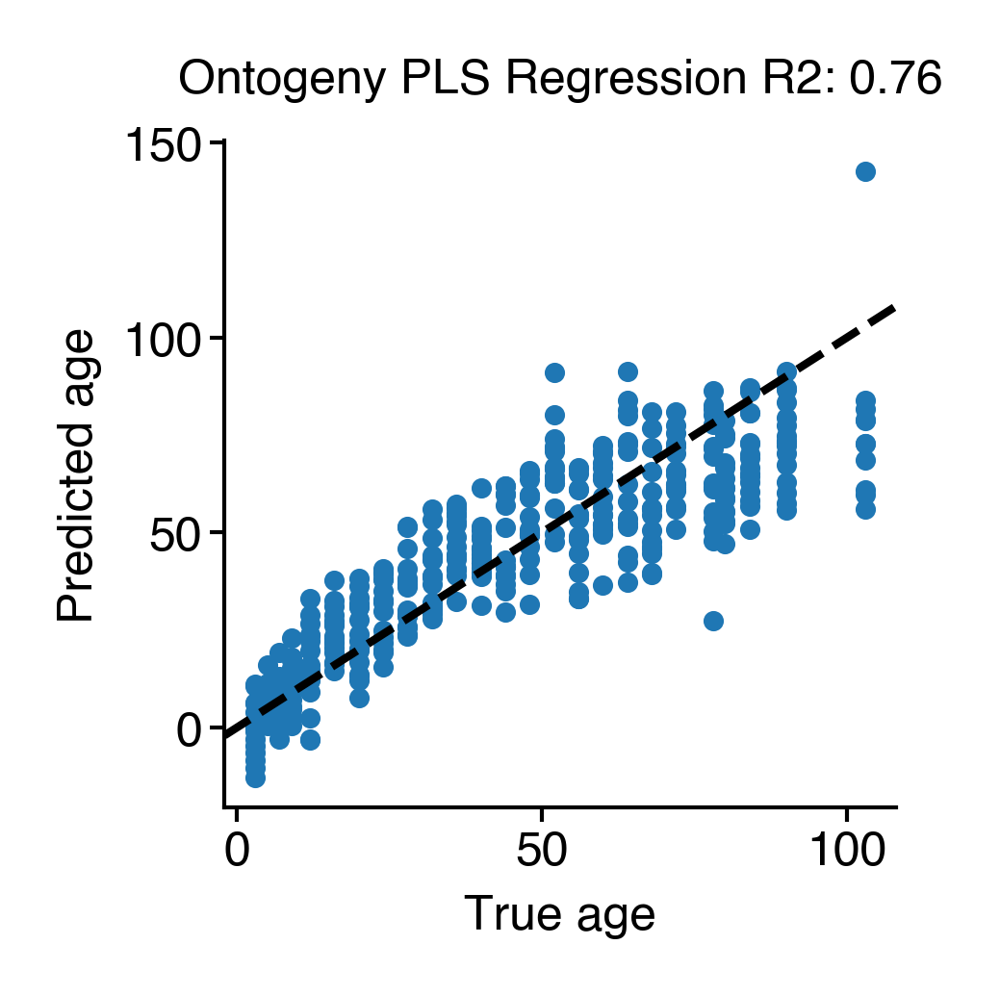

In [ ]:
fig = figure(1.5, 1.5)
ax = fig.gca()
ax.scatter(real_age, preds, s=3)
ax.set(xlabel="True age", ylabel="Predicted age", title=f"Ontogeny PLS Regression R2: {r2:0.2f}")
dotted_identity(ax)
sns.despine()

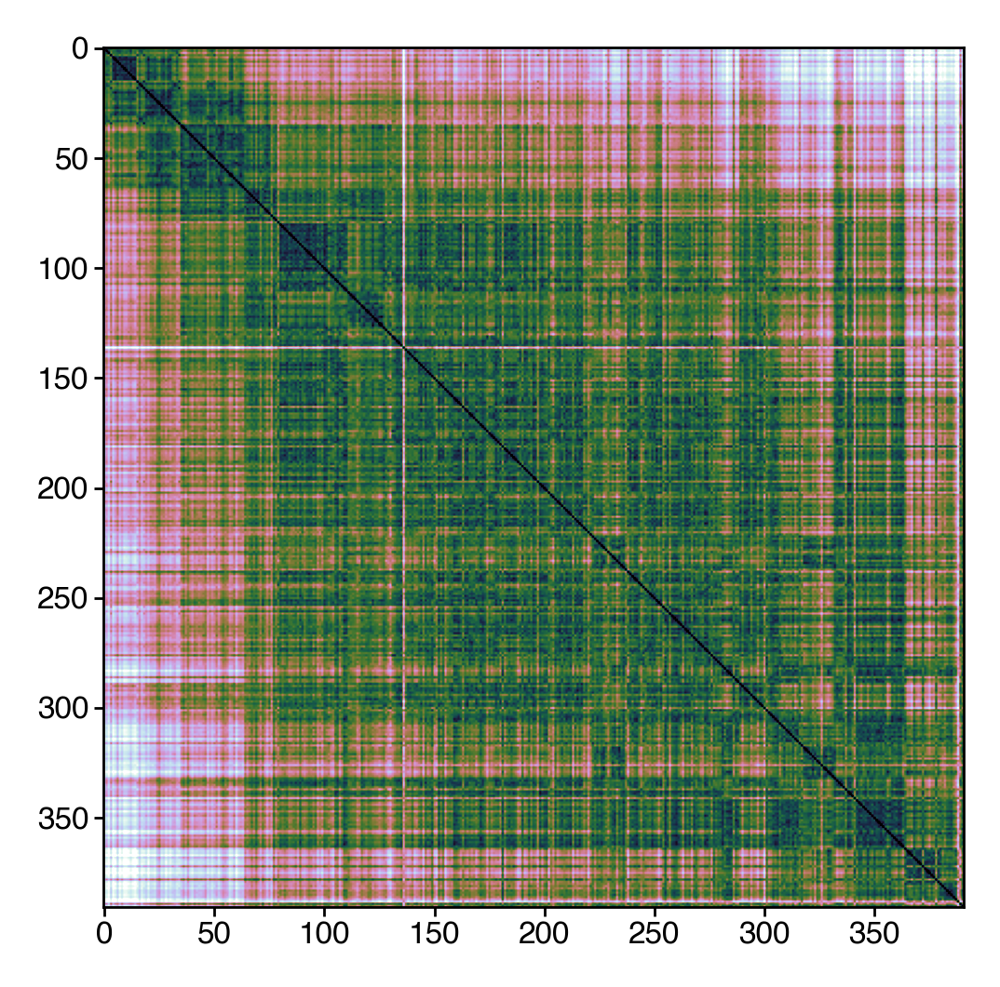

In [ ]:
plt.imshow(squareform(pdist(df.sort_index(level='age'), metric='jensenshannon')), vmax=0.6, vmin=0.1, cmap='cubehelix')

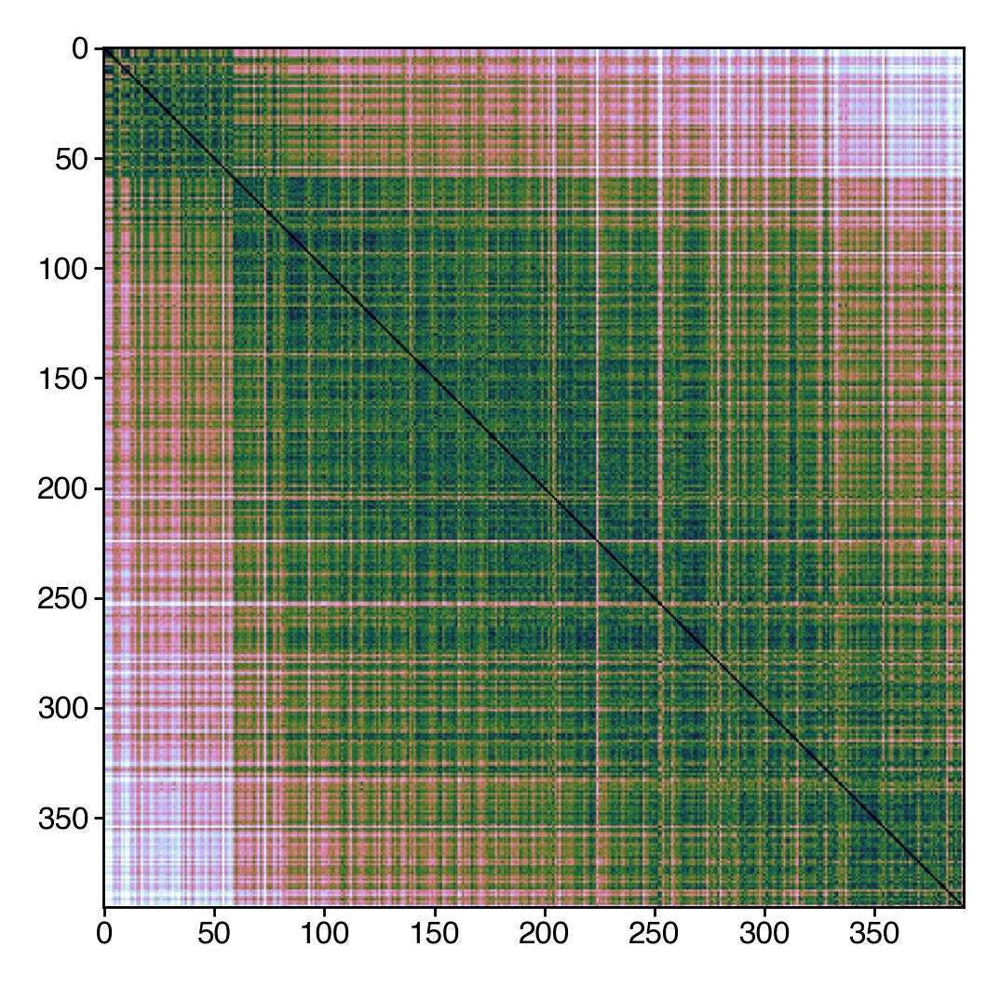

In [ ]:
inds = np.argsort(preds)
plt.imshow(squareform(pdist(df.iloc[inds], metric='jensenshannon')), vmax=0.6, vmin=0.1, cmap='cubehelix')

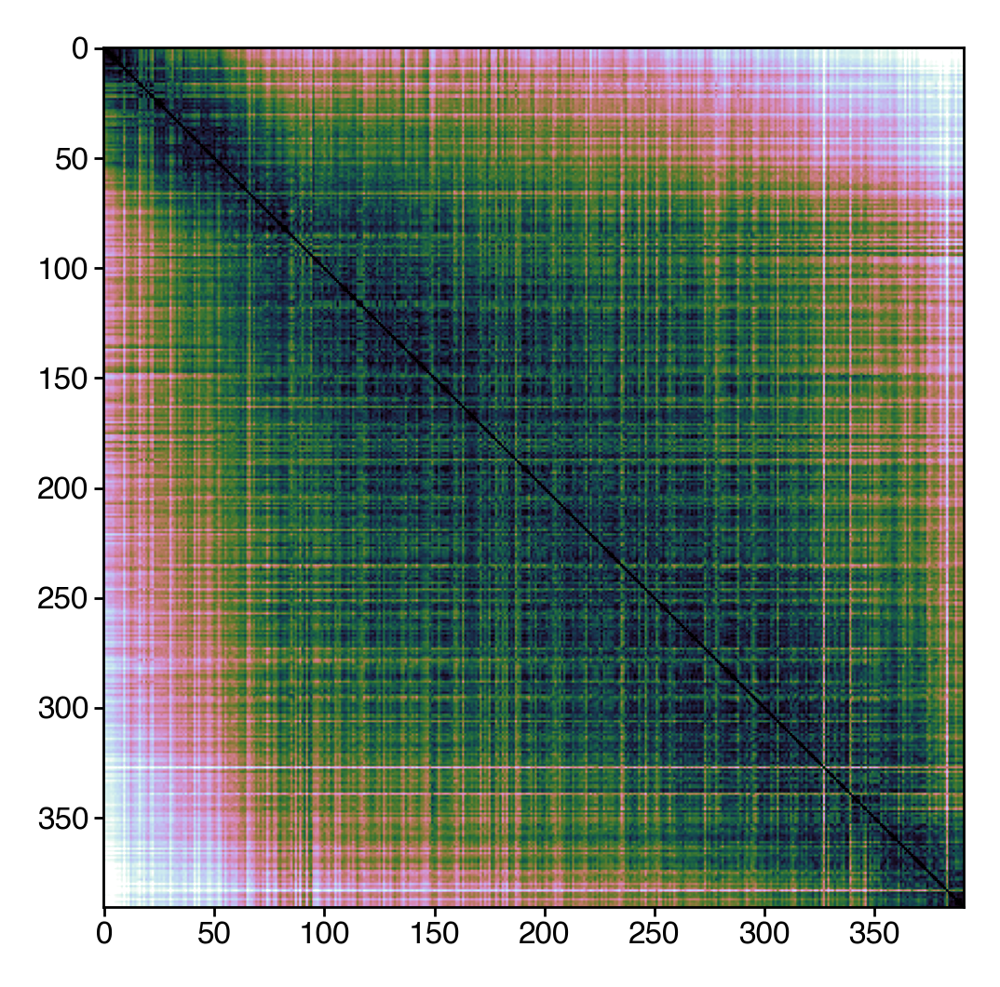

In [ ]:
plt.imshow(
    squareform(pdist(df.sort_index(level="pseudotime_rank"), metric="jensenshannon")),
    vmax=0.6,
    vmin=0.15,
    cmap="cubehelix",
)